# "[PointRend](https://arxiv.org/abs/1912.08193) in Detectron2" Tutorial

<img src="https://dl.fbaipublicfiles.com/detectron2/Detectron2-Logo-Horz.png" width="500">

Welcome to the [PointRend project](https://github.com/facebookresearch/detectron2/tree/master/projects/PointRend) in detectron2! In this tutorial, we will go through some basics usage of PointRend, including the following:
* Run inference on images or videos, with an existing PointRend model
* Look into PointRend internal representation.

You can make a copy of this tutorial or use "File -> Open in playground mode" to play with it yourself.


# Install detectron2

In [1]:
# install dependencies: 
!pip install pyyaml==5.1
# check pytorch installation: 
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())

1.11.0+cu113 True


In [2]:
# clone the repo in order to access pre-defined configs in PointRend project
!git clone --branch v0.6 https://github.com/facebookresearch/detectron2.git detectron2_repo
# install detectron2 from source
!pip install -e detectron2_repo
# See https://detectron2.readthedocs.io/tutorials/install.html for other installation options

fatal: destination path 'detectron2_repo' already exists and is not an empty directory.
Obtaining file:///content/detectron2_repo
  Attempting uninstall: detectron2
    Found existing installation: detectron2 0.6
    Can't uninstall 'detectron2'. No files were found to uninstall.
  Running setup.py develop for detectron2


In [3]:
# You may need to restart your runtime prior to this, to let your installation take effect
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import torch
from google.colab.patches import cv2_imshow
from PIL import Image

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer, ColorMode
from detectron2.data import MetadataCatalog
coco_metadata = MetadataCatalog.get("coco_2017_val")
seg_metadata = MetadataCatalog.get("cityscapes_fine_instance_seg_val")

# import PointRend project
from detectron2.projects import point_rend

# Run a pre-trained PointRend model

We first download an image from the COCO dataset:

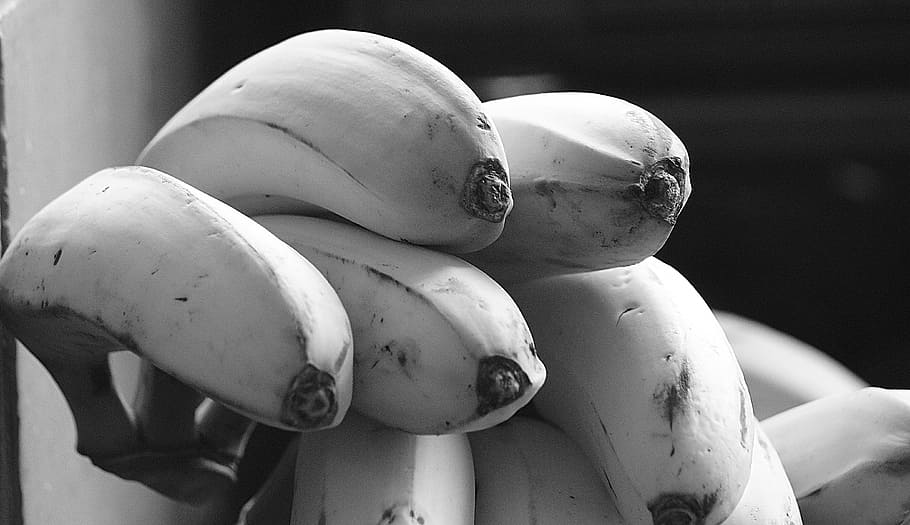

In [5]:
# !wget http://images.cocodataset.org/val2017/000000005477.jpg -q -O input.jpg
!wget https://i.pinimg.com/originals/5f/fc/9c/5ffc9c8ef41dae5244906ba06ac7789e.jpg -q -O input.jpg
# !wget https://upload.wikimedia.org/wikipedia/commons/9/97/Blick_auf_A_2_bei_Rastst%C3%A4tte_Lehrter_See_%282009%29.jpg -q -O thing.jpg
# !wget https://scontent-bos3-1.xx.fbcdn.net/v/t1.15752-9/279649897_277399917845280_6835781955635030182_n.jpg?_nc_cat=104&ccb=1-6&_nc_sid=ae9488&_nc_ohc=HbgBLNIip-EAX-wmIdg&tn=gjz9LVCY1bm-hhcn&_nc_ht=scontent-bos3-1.xx&oh=03_AVJO9gMBgFpwpJhUYWXGJnT34XUTDYeIrPEcj99sHQF8EA&oe=6298F0BE -q -O banana.jpg
im = cv2.imread("/content/279649897_277399917845280_6835781955635030182_n.jpg")
cv2_imshow(im)

Then, we create a detectron2 config and a detectron2 `DefaultPredictor` to run inference on this image. First, we make a prediction using a standard Mask R-CNN model.

model_final_cafdb1.pkl: 261MB [00:25, 10.2MB/s]                           
/content/detectron2_repo/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride
/usr/local/lib/python3.7/dist-packages/torch/functional.py:568: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2228.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


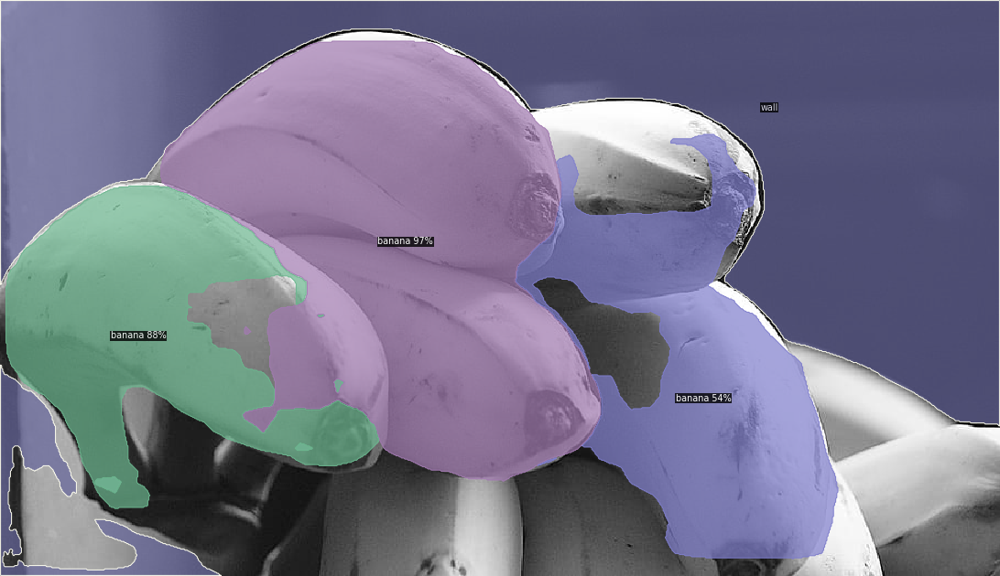

In [7]:
# cfg = get_cfg()
# cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
# cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model
# cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
# mask_rcnn_predictor = DefaultPredictor(cfg)
# mask_rcnn_outputs = mask_rcnn_predictor(im)
# Inference with a panoptic segmentation model
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-PanopticSegmentation/panoptic_fpn_R_101_3x.yaml"))
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-PanopticSegmentation/panoptic_fpn_R_101_3x.yaml")
predictor = DefaultPredictor(cfg)
panoptic_seg, segments_info = predictor(im)["panoptic_seg"]
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_panoptic_seg_predictions(panoptic_seg.to("cpu"), segments_info)
cv2_imshow(out.get_image()[:, :, ::-1])

Now, we load a PointRend model and show its prediction.

In [8]:
cfg = get_cfg()
# Add PointRend-specific config
point_rend.add_pointrend_config(cfg)
# Load a config from file

# cfg.merge_from_file("detectron2_repo/projects/PointRend/configs/InstanceSegmentation/pointrend_rcnn_R_50_FPN_3x_coco.yaml")
cfg.merge_from_file("detectron2_repo/projects/PointRend/configs/SemanticSegmentation/pointrend_semantic_R_101_FPN_1x_cityscapes.yaml")

# cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.9  # set threshold for this model
cfg.MODEL.POINT_HEAD.SUBDIVISION_STEPS = 2


# Use a model from PointRend model zoo: https://github.com/facebookresearch/detectron2/tree/master/projects/PointRend#pretrained-models
# cfg.MODEL.WEIGHTS = "detectron2://ImageNetPretrained/MSRA/R-101.pkl"#"detectron2://PointRend/InstanceSegmentation/pointrend_rcnn_R_50_FPN_3x_coco/164955410/model_final_edd263.pkl"
cfg.MODEL.WEIGHTS = "detectron2://PointRend/SemanticSegmentation/pointrend_semantic_R_101_FPN_1x_cityscapes/202576688/model_final_cf6ac1.pkl"
predictor = DefaultPredictor(cfg)
outputs = predictor(im)

model_final_cf6ac1.pkl: 191MB [00:04, 42.4MB/s]                           
The checkpoint state_dict contains keys that are not used by the model:
  pixel_mean
  pixel_std
/content/detectron2_repo/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride
/content/detectron2_repo/projects/PointRend/point_rend/point_features.py:142: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current beh

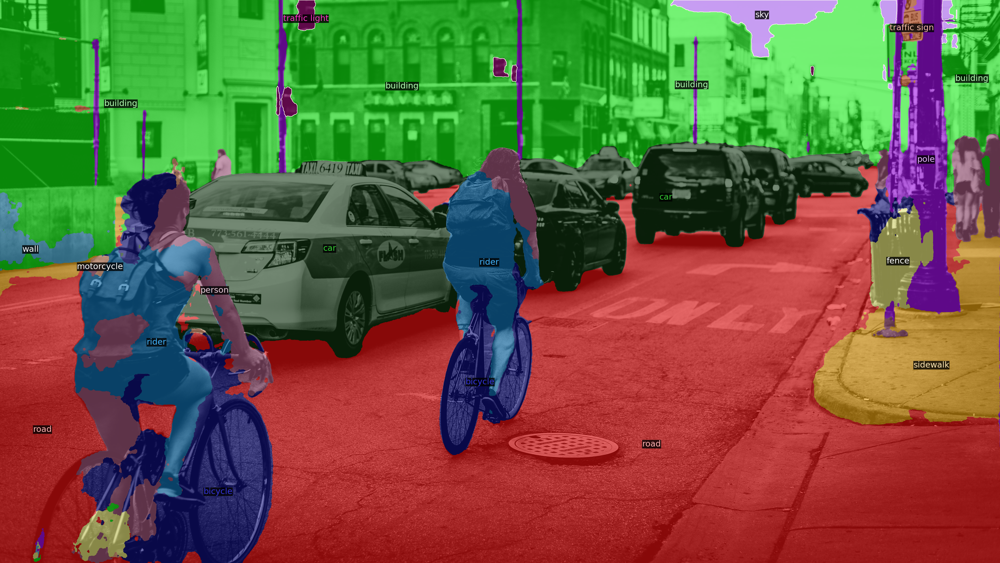

In [9]:
# Show and compare two predictions: 
v = Visualizer(im[:, :, ::-1], seg_metadata, scale=1.2, instance_mode=ColorMode.IMAGE_BW)
# mask_rcnn_result = v.draw_instance_predictions(mask_rcnn_outputs["instances"].to("cpu")).get_image()
v = Visualizer(im[:, :, ::-1], seg_metadata, scale=1.0, instance_mode=ColorMode.SEGMENTATION)


# point_rend_result = v.draw_instance_predictions(outputs["instances"].to("cpu")).get_image()
mask = outputs["sem_seg"].argmax(dim=0).to("cpu")
point_rend_result = v.draw_sem_seg(mask.to("cpu"), alpha=0.5).get_image()

pil_overlay = Image.fromarray(point_rend_result)
pil_overlay

# print("Mask R-CNN with PointRend (top)     vs.     Default Mask R-CNN (bottom)")
# # cv2_imshow(np.concatenate((point_rend_result, mask_rcnn_result), axis=0)[:, :, ::-1])
# cv2_imshow(point_rend_result)

# Visualize PointRend point sampling process

In this section we show how PointRend's point sampling process works. To do this, we need to access intermediate representations of the predictor `model.forward(...)` function. Thus, we run forward step manually by accessing the internal states & attributes of the model.

In [ ]:
# First we define a simple function to help us plot the intermediate representations.
import matplotlib.pyplot as plt

def plot_mask(mask, title="", point_coords=None, figsize=10, point_marker_size=5):
  '''
  Simple plotting tool to show intermediate mask predictions and points 
  where PointRend is applied.
  
  Args:
    mask (Tensor): mask prediction of shape HxW
    title (str): title for the plot
    point_coords ((Tensor, Tensor)): x and y point coordinates
    figsize (int): size of the figure to plot
    point_marker_size (int): marker size for points
  '''

  H, W = mask.shape
  plt.figure(figsize=(figsize, figsize))
  if title:
    title += ", "
  plt.title("{}resolution {}x{}".format(title, H, W), fontsize=30)
  plt.ylabel(H, fontsize=30)
  plt.xlabel(W, fontsize=30)
  plt.xticks([], [])
  plt.yticks([], [])
  plt.imshow(mask, interpolation="nearest", cmap=plt.get_cmap('gray'))
  if point_coords is not None:
    plt.scatter(x=point_coords[0], y=point_coords[1], color="red", s=point_marker_size, clip_on=True) 
  plt.xlim(-0.5, W - 0.5)
  plt.ylim(H - 0.5, - 0.5)
  plt.show()

With `predictor` and `im` loaded in the previous section we run backbone, bounding box prediction, and coarse mask segmenation head. We visualize mask prediction for the foreground plane on the image.

In [ ]:
from detectron2.data import transforms as T
model = predictor.model
# In this image we detect several objects but show only the first one.
instance_idx = 0
# Mask predictions are class-specific, "plane" class has id 4.
category_idx = 4

with torch.no_grad():
  # Prepare input image.
  height, width = im.shape[:2]
  im_transformed = T.ResizeShortestEdge(800, 1333).get_transform(im).apply_image(im)
  batched_inputs = [{"image": torch.as_tensor(im_transformed).permute(2, 0, 1)}]

  # Get bounding box predictions first to simplify the code.
  detected_instances = [x["instances"] for x in model.inference(batched_inputs)]
  [r.remove("pred_masks") for r in detected_instances]  # remove existing mask predictions
  pred_boxes = [x.pred_boxes for x in detected_instances] 

  # Run backbone.
  images = model.preprocess_image(batched_inputs)
  features = model.backbone(images.tensor)
  
  # Given the bounding boxes, run coarse mask prediction head.
  mask_coarse_logits = model.roi_heads.mask_head.coarse_head(model.roi_heads.mask_head._roi_pooler(features, pred_boxes))

  plot_mask(
      mask_coarse_logits[instance_idx, category_idx].to("cpu"),
      title="Coarse prediction"
  )


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  ../torch/csrc/utils/tensor_numpy.cpp:178.)
  if sys.path[0] == '':


AttributeError: ignored

In [ ]:
# Prepare features maps to use later
mask_features_list = [
  features[k] for k in model.roi_heads.mask_head.mask_point_in_features
]
features_scales = [
  model.roi_heads.mask_head._feature_scales[k] 
  for k in model.roi_heads.mask_head.mask_point_in_features
]

### Point sampling during training

During training we select points where coarse prediction is uncertain to train PointRend head. See section 3.1 in the PointRend [paper](https://arxiv.org/abs/1912.08193) for more details.

To visualize different sampling strategy change `oversample_ratio` and `importance_sample_ratio` parameters below.

In [ ]:
from detectron2.projects.point_rend.mask_head import calculate_uncertainty
from detectron2.projects.point_rend.point_features import get_uncertain_point_coords_with_randomness

# Change number of points to select
num_points = 14 * 14
# Change randomness parameters 
oversample_ratio = 3  # `k` in the paper
importance_sample_ratio = 0.75  # `\beta` in the paper

with torch.no_grad():
  # We take predicted classes, whereas during real training ground truth classes are used.
  pred_classes = torch.cat([x.pred_classes for x in detected_instances])

  # Select points given a corse prediction mask
  point_coords = get_uncertain_point_coords_with_randomness(
    mask_coarse_logits,
    lambda logits: calculate_uncertainty(logits, pred_classes),
    num_points=num_points,
    oversample_ratio=oversample_ratio,
    importance_sample_ratio=importance_sample_ratio
  )

  H, W = mask_coarse_logits.shape[-2:]
  plot_mask(
    mask_coarse_logits[instance_idx, category_idx].to("cpu"),
    title="Sampled points over the coarse prediction",
    point_coords=(
      W * point_coords[instance_idx, :, 0].to("cpu") - 0.5,
      H * point_coords[instance_idx, :, 1].to("cpu") - 0.5
    ),
    point_marker_size=50
  )

### Point sampling during inference

Starting from a 7x7 coarse prediction we bilinearly upsample it `num_subdivision_steps` times. At each step we find `num_subdivision_points` most uncertain points and make predictions for them using the PointRend head. See section 3.1 in the [paper](https://arxiv.org/abs/1912.08193) to know more details.

Change `num_subdivision_steps` and `num_subdivision_points` parameters to change inference behavior.

In [ ]:
from detectron2.layers import interpolate
from detectron2.projects.point_rend.mask_head import calculate_uncertainty
from detectron2.projects.point_rend.point_features import (
    get_uncertain_point_coords_on_grid,
    point_sample,
    point_sample_fine_grained_features,
)

num_subdivision_steps = 5
num_subdivision_points = 28 * 28


with torch.no_grad():
  plot_mask(
      mask_coarse_logits[0, category_idx].to("cpu").numpy(), 
      title="Coarse prediction"
  )

  mask_logits = mask_coarse_logits
  for subdivions_step in range(num_subdivision_steps):
    # Upsample mask prediction
    mask_logits = interpolate(
        mask_logits, scale_factor=2, mode="bilinear", align_corners=False
    )
    # If `num_subdivision_points` is larger or equalt to the
    # resolution of the next step, then we can skip this step
    H, W = mask_logits.shape[-2:]
    if (
      num_subdivision_points >= 4 * H * W
      and subdivions_step < num_subdivision_steps - 1
    ):
      continue
    # Calculate uncertainty for all points on the upsampled regular grid
    uncertainty_map = calculate_uncertainty(mask_logits, pred_classes)
    # Select most `num_subdivision_points` uncertain points
    point_indices, point_coords = get_uncertain_point_coords_on_grid(
        uncertainty_map, 
        num_subdivision_points
    )

    # Extract fine-grained and coarse features for the points
    fine_grained_features, _ = point_sample_fine_grained_features(
      mask_features_list, features_scales, pred_boxes, point_coords
    )
    coarse_features = point_sample(mask_coarse_logits, point_coords, align_corners=False)

    # Run PointRend head for these points
    point_logits = model.roi_heads.mask_head.point_head(fine_grained_features, coarse_features)

    # put mask point predictions to the right places on the upsampled grid.
    R, C, H, W = mask_logits.shape
    x = (point_indices[instance_idx] % W).to("cpu")
    y = (point_indices[instance_idx] // W).to("cpu")
    point_indices = point_indices.unsqueeze(1).expand(-1, C, -1)
    mask_logits = (
      mask_logits.reshape(R, C, H * W)
      .scatter_(2, point_indices, point_logits)
      .view(R, C, H, W)
    )
    plot_mask(
      mask_logits[instance_idx, category_idx].to("cpu"), 
      title="Subdivision step: {}".format(subdivions_step + 1),
      point_coords=(x, y)
    )

We can visualize mask prediction obtained in the previous block.

In [ ]:
from detectron2.modeling import GeneralizedRCNN
from detectron2.modeling.roi_heads.mask_head import mask_rcnn_inference

results = detected_instances
mask_rcnn_inference(mask_logits, results)
results = GeneralizedRCNN._postprocess(results, batched_inputs, images.image_sizes)[0]

# We can use `Visualizer` to draw the predictions on the image.
v = Visualizer(im_transformed[:, :, ::-1], coco_metadata)
v = v.draw_instance_predictions(results["instances"].to("cpu"))
cv2_imshow(v.get_image()[:, :, ::-1])